In [1]:
try:
    import matplotlib
except ImportError as e:
    !pip install matplotlib

try:
    import tensorflow
except ImportError as e:
    !pip intall tensorflow-gpu

In [2]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K
import numpy as np
from matplotlib import pyplot as plt
from keras.datasets import cifar10

print('This is an implemention about Gnerative Adversarial Networks based on Tensorflow. ')
print('The network induces an additional attention module to improve the performance')
print('the dataset used is cifar10')

This is an implemention about Gnerative Adversarial Networks based on Tensorflow. 
The network induces an additional attention module to improve the performance
the dataset used is cifar10


Using TensorFlow backend.


In [3]:
batch_size = 32
latent_size = 100
epoch_num = 20

In [4]:
# Load Data Cifar10 32x32
(x_train, _),(x_test, _) = cifar10.load_data()
x_train, x_test = x_train / 127.5 - 1,	x_test  / 127.5 - 1
dataset = np.concatenate((x_train, x_test), 0)
dataset_size = dataset.shape[0]
print("cifar10 contains %d images"% (dataset_size))

cifar10 contains 60000 images


In [5]:
class Attention(layers.Layer):

    def __init__(self, b, h, w, c):
        super(Attention, self).__init__()

        self.h = h
        self.w = w
        self.c = c
        self.b = b

        self.query_w = self.add_weight(shape=(1, 1, c, c//4), initializer="random_normal", trainable=True)
        self.query_b = self.add_weight(shape=(c//4,), initializer="zeros", trainable=True)

        self.key_w = self.add_weight(shape=(1, 1, c, c//4), initializer="random_normal", trainable=True)
        self.key_b = self.add_weight(shape=(c//4,), initializer="zeros", trainable=True)

        self.value_w = self.add_weight(shape=(1, 1, c, c), initializer="random_normal", trainable=True)
        self.value_b = self.add_weight(shape=(c,), initializer="zeros", trainable=True)

        self.gamma = self.add_weight(shape=(1, ), initializer="random_normal", trainable=True)

    def call(self, inputs):
        query = tf.matmul(inputs, self.query_w) + self.query_b
        query = tf.reshape(query, (self.b, self.h * self.w, self.c//4))

        key = tf.matmul(inputs, self.key_w) + self.key_b
        key = tf.reshape(key, (self.b, self.h * self.w, self.c//4))

        value = tf.matmul(inputs, self.value_w) + self.value_b
        value = tf.reshape(value, (self.b, self.h * self.w, self.c))

        attention = tf.matmul(query, key, transpose_b=True)
        attention = tf.nn.softmax(attention)

        out = tf.matmul(attention, value)
        out = tf.reshape(out, (self.b, self.h, self.w, self.c))

        return self.gamma * out + out

In [6]:
def Discriminator(c=32):

    model = keras.Sequential(
    [
        # layer1 : B, 16, 16, 32
        layers.Conv2D(c, (3, 3), strides=(2, 2), padding="same"),
        layers.BatchNormalization(momentum=0.8),
        layers.LeakyReLU(alpha=0.2),
        

        # layer2 : B, 8, 8, 64
        layers.Conv2D(2*c, (3, 3), strides=(2, 2), padding="same"),
        layers.BatchNormalization(momentum=0.8),
        layers.LeakyReLU(alpha=0.2),
        
        #Attention(batch_size, 8, 8, 2*c),

        # layer3 : B, 4, 4, 128
        layers.Conv2D(4*c, (3, 3), strides=(2, 2), padding="same"),
        layers.BatchNormalization(momentum=0.8),
        layers.LeakyReLU(alpha=0.2),
        
        #Attention(batch_size, 4, 4, 4*c),

        # layer4 : B, 2, 2, 256
        layers.Conv2D(8*c, (3, 3), strides=(2, 2), padding="same"),
        layers.BatchNormalization(momentum=0.8),
        layers.LeakyReLU(alpha=0.2),

        layers.Flatten(),
        layers.Dense(1, activation='sigmoid'),
    ], name="discriminator")
    
    inputs = layers.Input(shape=(32, 32, 3))
    return Model(inputs, model(inputs))

D_net = Discriminator()
D_net.summary()

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 32, 32, 3)]       0         
_________________________________________________________________
discriminator (Sequential)   (None, 1)                 391361    
Total params: 391,361
Trainable params: 390,401
Non-trainable params: 960
_________________________________________________________________


In [7]:
def Generator(c=32):
    model = keras.Sequential(
        [
            layers.Dense(4 * 4 * 8*c),
            layers.Reshape((4, 4, 8*c)),

            # layer1 : B, 8, 8, 128
            layers.UpSampling2D(),
            layers.Conv2D(4*c, (4, 4), padding="same", activation='relu'),
            layers.BatchNormalization(momentum=0.8),

            Attention(batch_size, 8, 8, 4*c),

            # layer2 : B, 16, 16, 64
            layers.UpSampling2D(),
            layers.Conv2D(2*c, (4, 4), padding="same", activation='relu'),
            layers.BatchNormalization(momentum=0.8),

            Attention(batch_size, 16, 16, 2*c),

            # layer3 : B, 32, 32, 32
            layers.UpSampling2D(),
            layers.Conv2D(c, (4, 4), padding="same", activation='relu'),
            layers.BatchNormalization(momentum=0.8),

            # layer4 : B, 32, 32, 3
            layers.Conv2D(3, (1, 1), activation='tanh'),
        ], name="generator")

    inputs = layers.Input(shape=(latent_size, ))
    return Model(inputs, model(inputs))


G_net = Generator()
G_net.summary()


Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 100)]             0         
_________________________________________________________________
generator (Sequential)       (32, 32, 32, 3)           1134053   
Total params: 1,134,053
Trainable params: 1,133,605
Non-trainable params: 448
_________________________________________________________________


In [8]:
optim = Adam(0.0002, 0.5)
D_net.compile(loss='binary_crossentropy', optimizer=optim)

inputs = layers.Input(shape=(latent_size, ))
fake_images = G_net(inputs)
D_net.trainable = False
outputs = D_net(fake_images)

Combined_net = keras.Model(inputs, outputs)
Combined_net.compile(loss='binary_crossentropy', optimizer=optim)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


In [9]:
def covert_to_show(array, rows, column):
    for r in range(rows):
        for l in range(column):
            row_img = array[r * rows + l] if l == 0 else np.concatenate((row_img, array[r * rows + l]), 1)
        show_img = row_img if r == 0 else np.concatenate((show_img, row_img), 0)

    return show_img

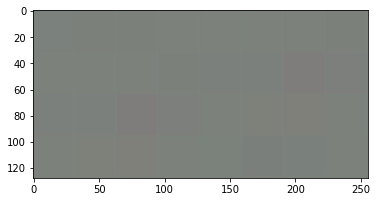

epoch 1, step 1: d_loss 1.190836, g_loss 0.432075


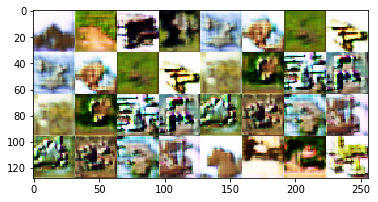

epoch 1, step 301: d_loss 0.601109, g_loss 0.981886


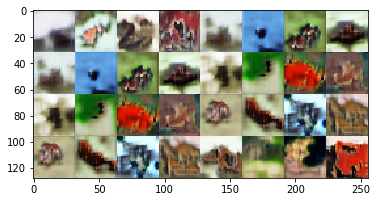

epoch 1, step 601: d_loss 0.574414, g_loss 1.328215


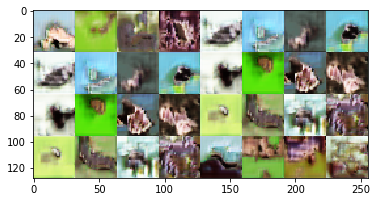

epoch 1, step 901: d_loss 0.631871, g_loss 1.170555


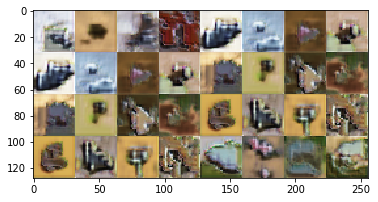

epoch 1, step 1201: d_loss 0.585080, g_loss 1.044229


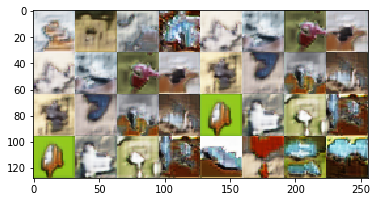

epoch 1, step 1501: d_loss 0.603024, g_loss 1.257842


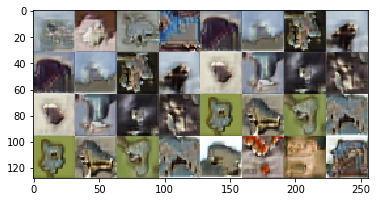

epoch 1, step 1801: d_loss 0.319734, g_loss 1.482055


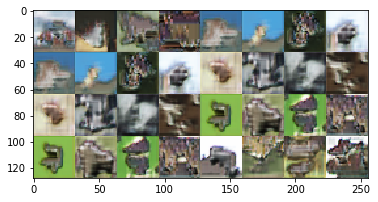

epoch 2, step 1: d_loss 0.492799, g_loss 1.213797


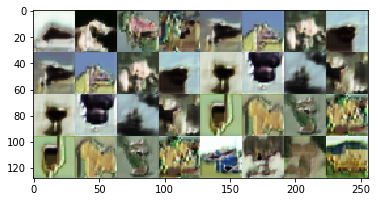

epoch 2, step 301: d_loss 0.538180, g_loss 1.487736


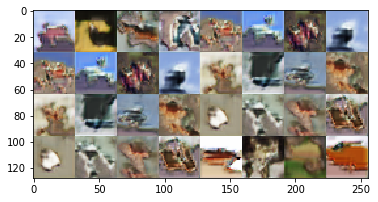

epoch 2, step 601: d_loss 0.569535, g_loss 1.962826


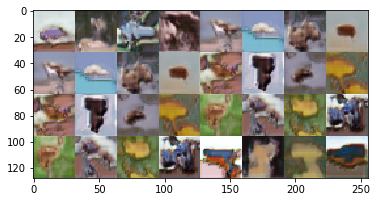

epoch 2, step 901: d_loss 0.293394, g_loss 2.186602


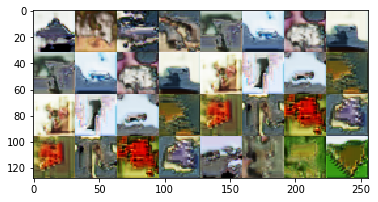

epoch 2, step 1201: d_loss 0.336602, g_loss 2.152502


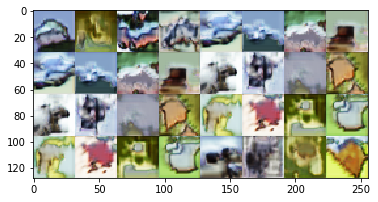

epoch 2, step 1501: d_loss 0.478259, g_loss 2.744828


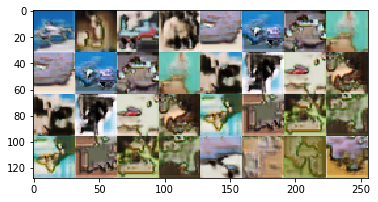

epoch 2, step 1801: d_loss 0.220241, g_loss 2.345544


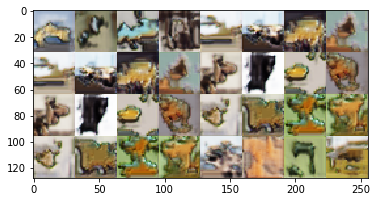

epoch 3, step 1: d_loss 0.219636, g_loss 2.069994


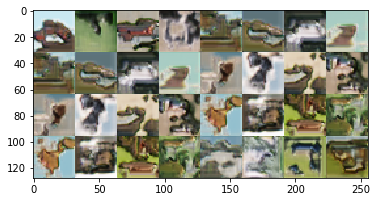

epoch 3, step 301: d_loss 0.177004, g_loss 2.633187


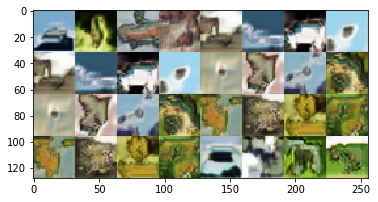

epoch 3, step 601: d_loss 0.260465, g_loss 2.493427


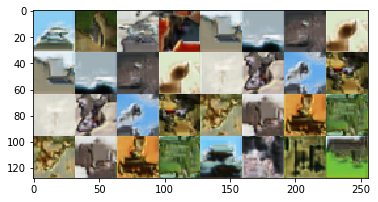

epoch 3, step 901: d_loss 0.524344, g_loss 1.670713


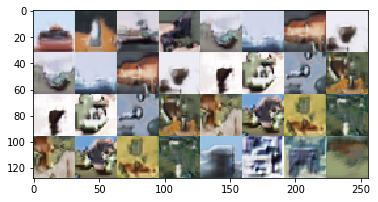

epoch 3, step 1201: d_loss 0.218862, g_loss 2.854827


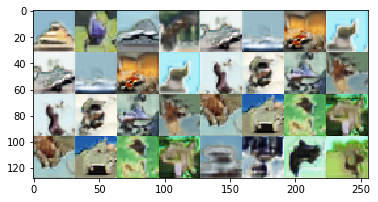

epoch 3, step 1501: d_loss 0.995154, g_loss 0.870138


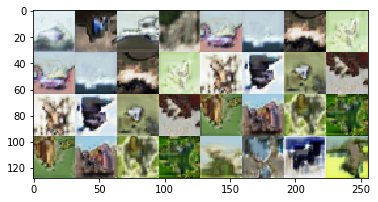

epoch 3, step 1801: d_loss 0.138518, g_loss 3.031061


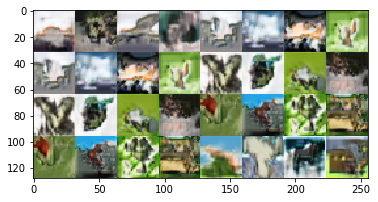

epoch 4, step 1: d_loss 0.290209, g_loss 1.611637


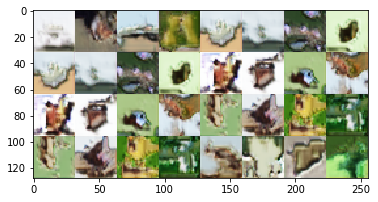

epoch 4, step 301: d_loss 0.192977, g_loss 2.560378


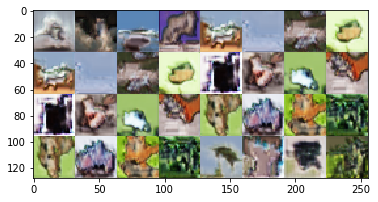

epoch 4, step 601: d_loss 0.102805, g_loss 1.628307


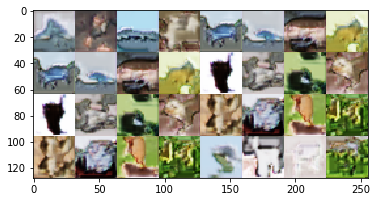

epoch 4, step 901: d_loss 0.183897, g_loss 2.854065


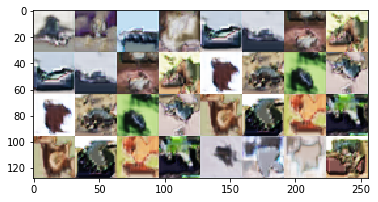

epoch 4, step 1201: d_loss 0.272146, g_loss 2.842710


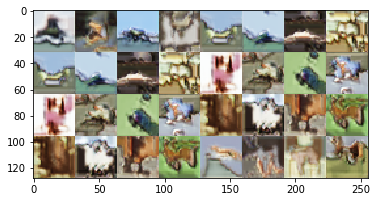

epoch 4, step 1501: d_loss 0.205551, g_loss 4.033069


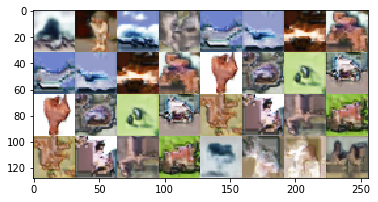

epoch 4, step 1801: d_loss 0.063979, g_loss 1.200499


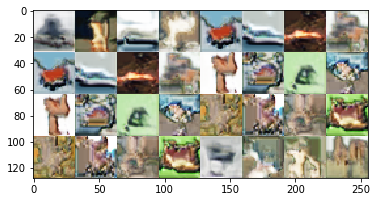

epoch 5, step 1: d_loss 0.287476, g_loss 3.716907


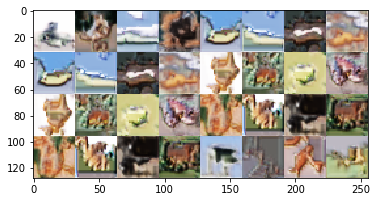

epoch 5, step 301: d_loss 0.168394, g_loss 3.283280


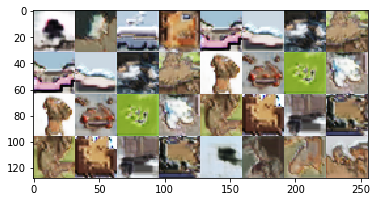

epoch 5, step 601: d_loss 0.376922, g_loss 2.109573


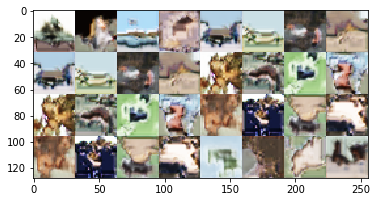

epoch 5, step 901: d_loss 0.544777, g_loss 3.112978


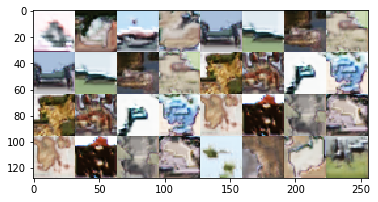

epoch 5, step 1201: d_loss 0.120960, g_loss 2.958066


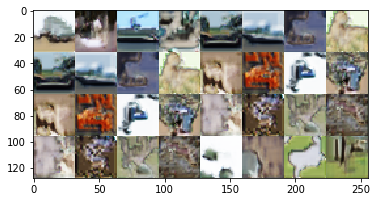

epoch 5, step 1501: d_loss 0.051794, g_loss 2.609582


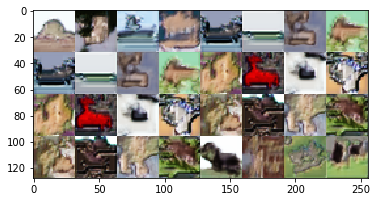

epoch 5, step 1801: d_loss 0.288070, g_loss 3.920899


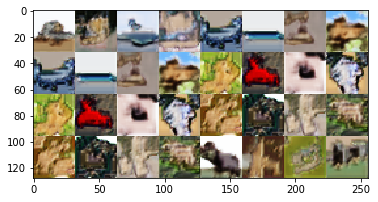

epoch 6, step 1: d_loss 0.020620, g_loss 3.306987


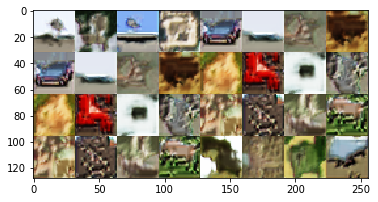

epoch 6, step 301: d_loss 0.021146, g_loss 4.543200


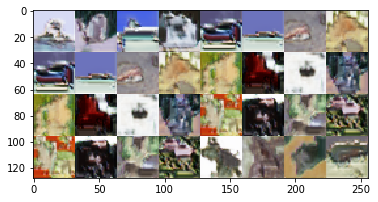

epoch 6, step 601: d_loss 0.388963, g_loss 2.139639


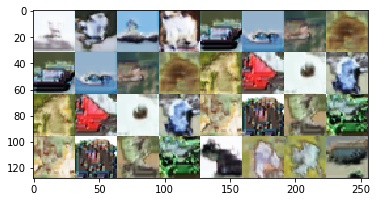

epoch 6, step 901: d_loss 0.131604, g_loss 3.352978


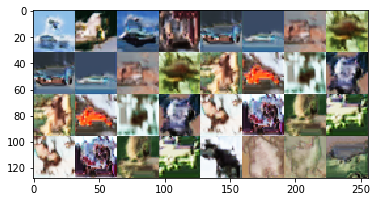

epoch 6, step 1201: d_loss 0.021292, g_loss 3.738217


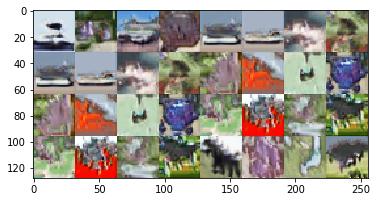

epoch 6, step 1501: d_loss 0.084951, g_loss 2.850826


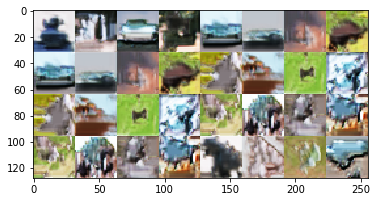

epoch 6, step 1801: d_loss 0.042740, g_loss 4.562339


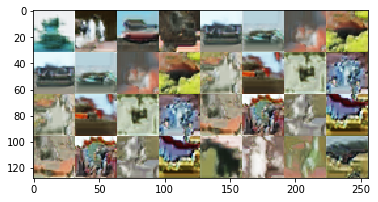

epoch 7, step 1: d_loss 0.020148, g_loss 3.377415


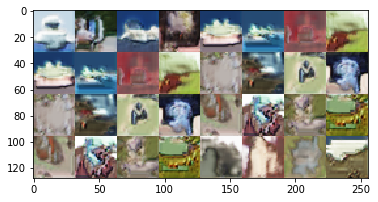

epoch 7, step 301: d_loss 0.020441, g_loss 1.934143


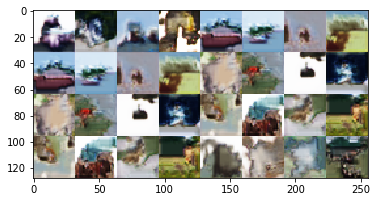

epoch 7, step 601: d_loss 0.553709, g_loss 4.690826


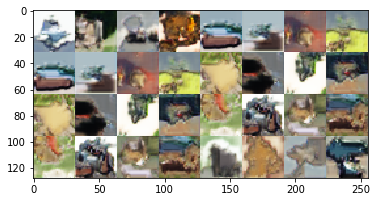

epoch 7, step 901: d_loss 0.036188, g_loss 4.480703


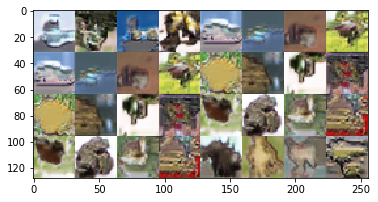

epoch 7, step 1201: d_loss 0.368035, g_loss 1.471723


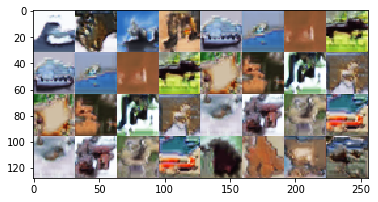

epoch 7, step 1501: d_loss 0.037785, g_loss 5.510934


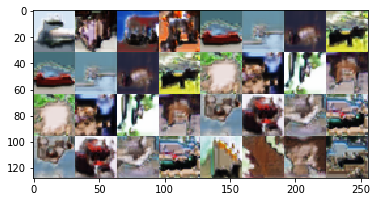

epoch 7, step 1801: d_loss 0.054873, g_loss 3.287045


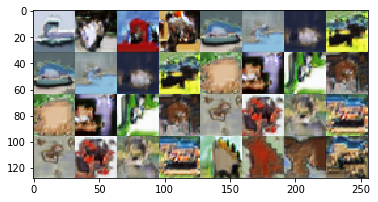

epoch 8, step 1: d_loss 0.049851, g_loss 4.371787


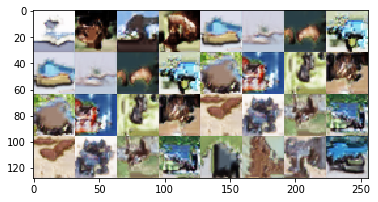

epoch 8, step 301: d_loss 0.331146, g_loss 3.713069


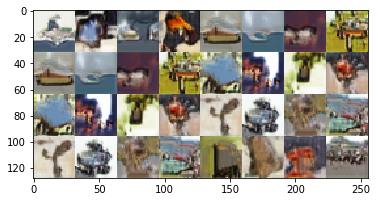

epoch 8, step 601: d_loss 0.067792, g_loss 3.169178


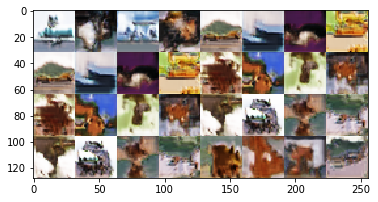

epoch 8, step 901: d_loss 0.026703, g_loss 4.727687


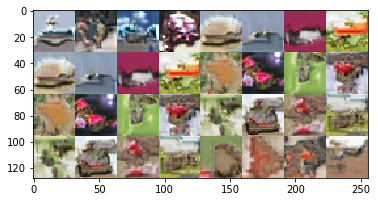

epoch 8, step 1201: d_loss 0.188267, g_loss 1.071175


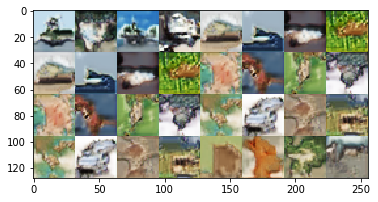

epoch 8, step 1501: d_loss 0.053622, g_loss 2.954596


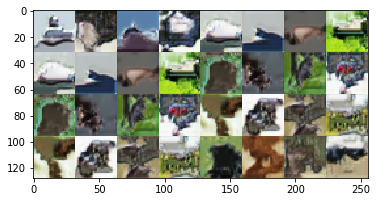

epoch 8, step 1801: d_loss 0.032724, g_loss 4.316327


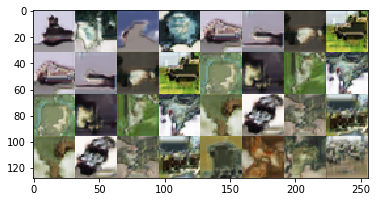

epoch 9, step 1: d_loss 0.008299, g_loss 1.778101


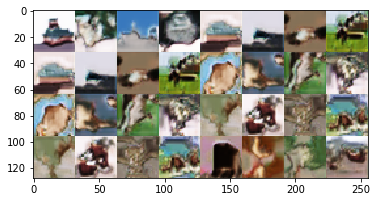

epoch 9, step 301: d_loss 0.017729, g_loss 3.168552


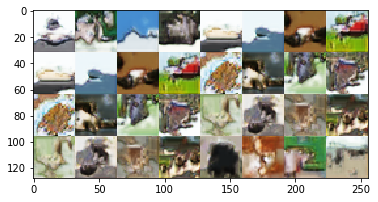

epoch 9, step 601: d_loss 0.019452, g_loss 3.515709


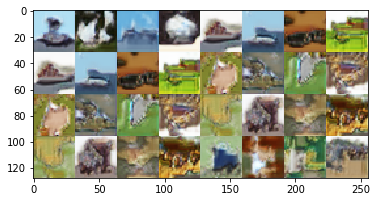

epoch 9, step 901: d_loss 0.149744, g_loss 5.977729


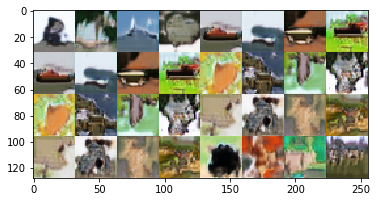

epoch 9, step 1201: d_loss 0.102004, g_loss 2.976789


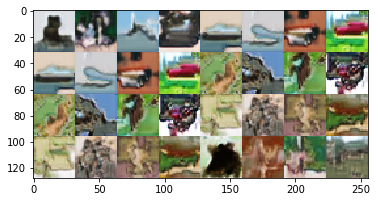

epoch 9, step 1501: d_loss 0.073875, g_loss 1.958365


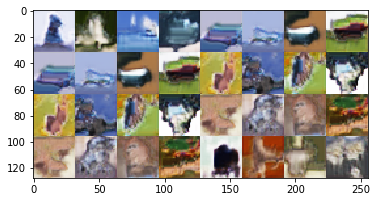

epoch 9, step 1801: d_loss 0.016275, g_loss 3.675298


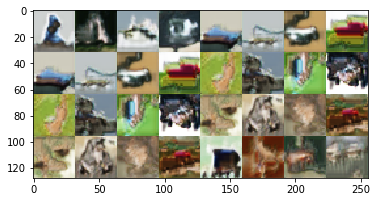

epoch 10, step 1: d_loss 1.179712, g_loss 3.409945


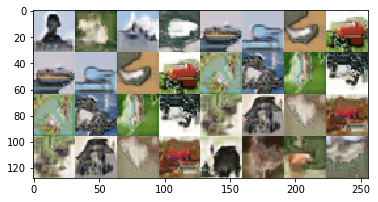

epoch 10, step 301: d_loss 0.006447, g_loss 4.546660


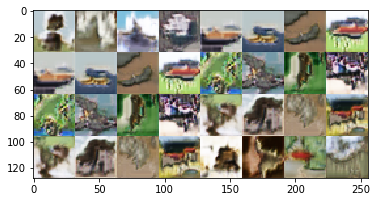

epoch 10, step 601: d_loss 0.050963, g_loss 1.898093


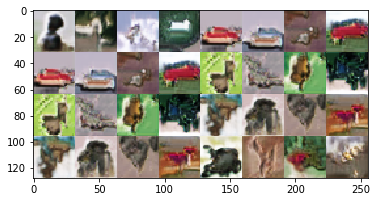

epoch 10, step 901: d_loss 0.816606, g_loss 4.943418


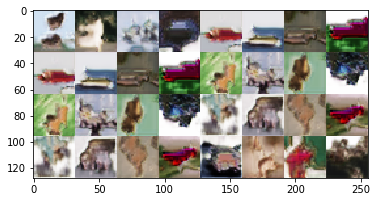

epoch 10, step 1201: d_loss 0.036874, g_loss 5.267768


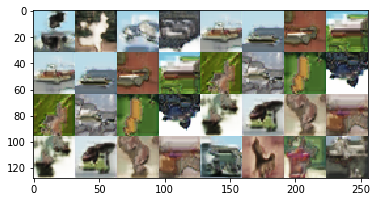

epoch 10, step 1501: d_loss 0.042304, g_loss 4.673977


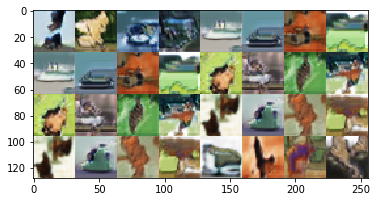

epoch 10, step 1801: d_loss 0.010778, g_loss 2.913882


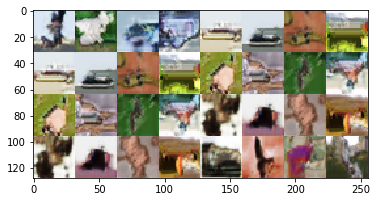

epoch 11, step 1: d_loss 0.005135, g_loss 3.866027


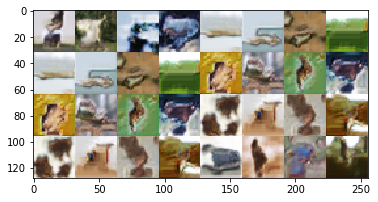

epoch 11, step 301: d_loss 0.008458, g_loss 4.891718


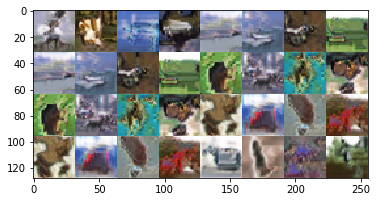

epoch 11, step 601: d_loss 0.011305, g_loss 7.026921


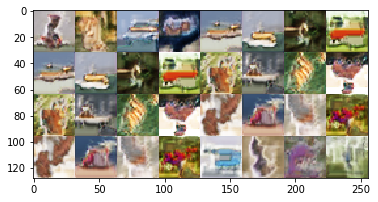

epoch 11, step 901: d_loss 0.014702, g_loss 2.952503


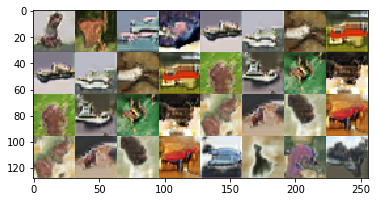

epoch 11, step 1201: d_loss 0.012784, g_loss 7.492255


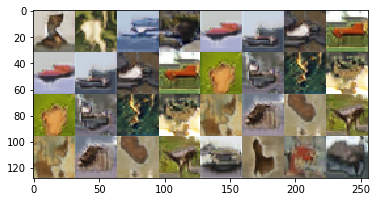

epoch 11, step 1501: d_loss 1.493246, g_loss 1.924908


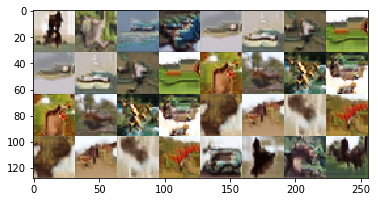

epoch 11, step 1801: d_loss 0.214989, g_loss 3.998326


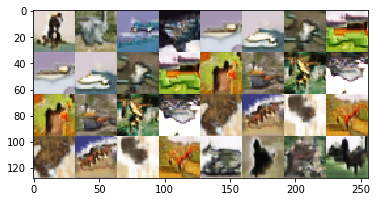

epoch 12, step 1: d_loss 0.084084, g_loss 4.742666


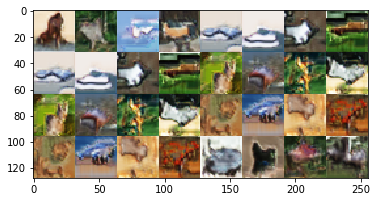

epoch 12, step 301: d_loss 0.059960, g_loss 3.193977


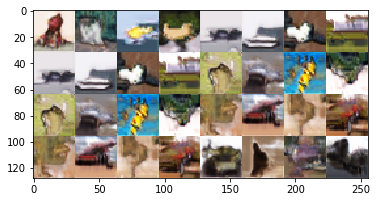

epoch 12, step 601: d_loss 0.011678, g_loss 3.211841


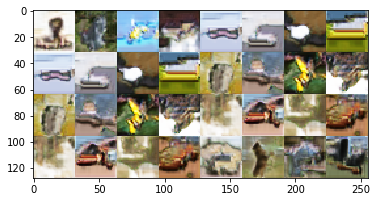

epoch 12, step 901: d_loss 0.022262, g_loss 3.813303


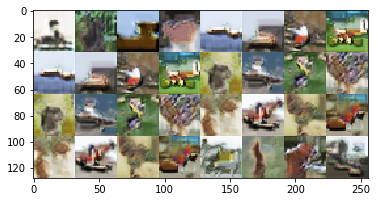

epoch 12, step 1201: d_loss 0.122935, g_loss 2.421361


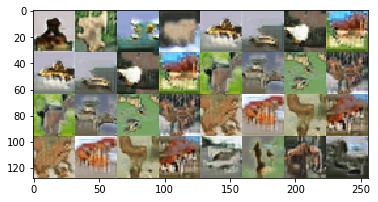

epoch 12, step 1501: d_loss 0.196817, g_loss 1.919239


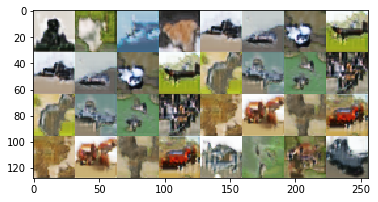

epoch 12, step 1801: d_loss 0.046643, g_loss 5.534466


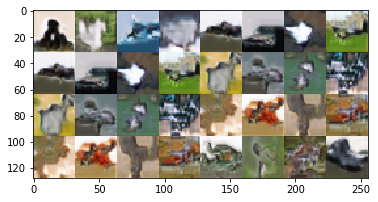

epoch 13, step 1: d_loss 0.016261, g_loss 4.263033


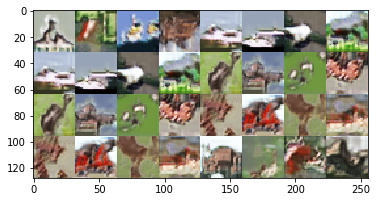

epoch 13, step 301: d_loss 0.038405, g_loss 4.169628


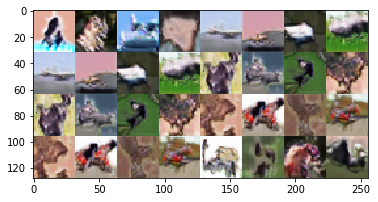

epoch 13, step 601: d_loss 0.055800, g_loss 2.287333


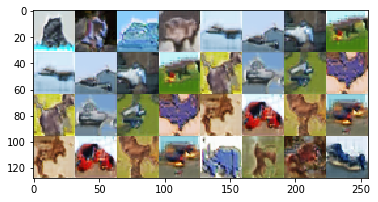

epoch 13, step 901: d_loss 0.070025, g_loss 6.362020


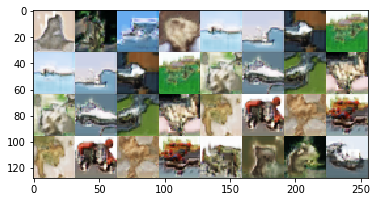

epoch 13, step 1201: d_loss 0.206312, g_loss 7.258970


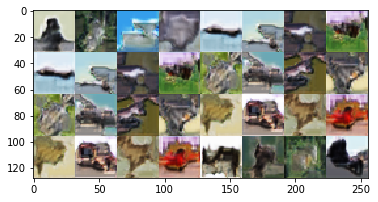

epoch 13, step 1501: d_loss 0.040526, g_loss 5.357156


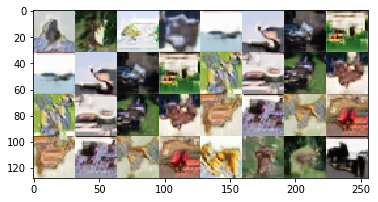

epoch 13, step 1801: d_loss 0.012433, g_loss 9.502711


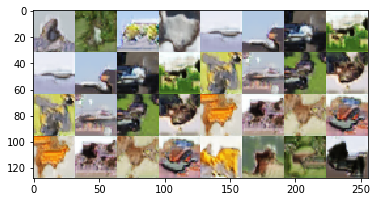

epoch 14, step 1: d_loss 0.393189, g_loss 3.708487


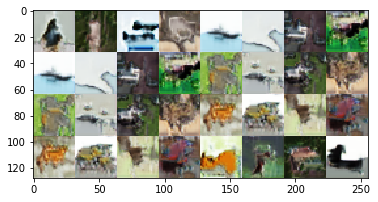

epoch 14, step 301: d_loss 0.066116, g_loss 5.328274


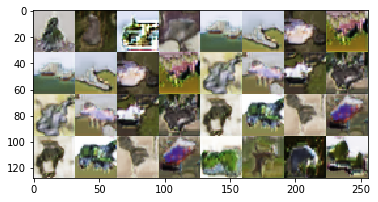

epoch 14, step 601: d_loss 0.107512, g_loss 5.014648


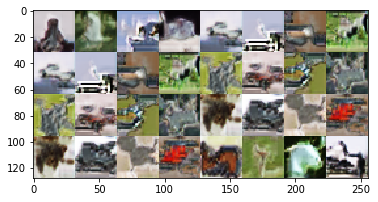

epoch 14, step 901: d_loss 0.019692, g_loss 4.246100


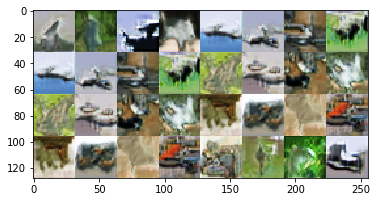

epoch 14, step 1201: d_loss 0.217668, g_loss 7.072382


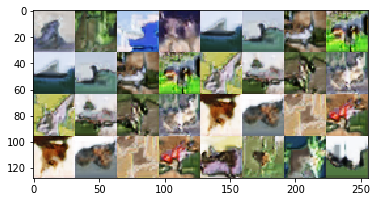

epoch 14, step 1501: d_loss 0.383894, g_loss 3.333797


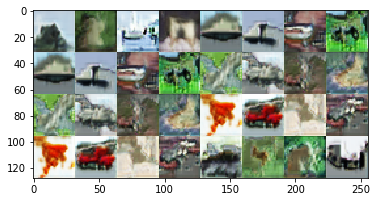

epoch 14, step 1801: d_loss 0.030765, g_loss 5.689646


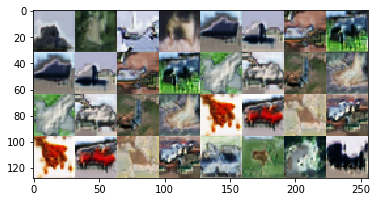

epoch 15, step 1: d_loss 0.026757, g_loss 5.876561


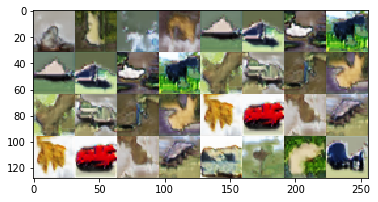

epoch 15, step 301: d_loss 0.351978, g_loss 3.431815


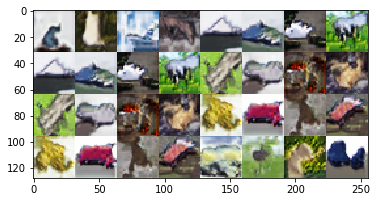

epoch 15, step 601: d_loss 0.026719, g_loss 3.258518


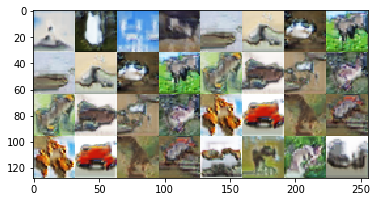

epoch 15, step 901: d_loss 0.005606, g_loss 8.263507


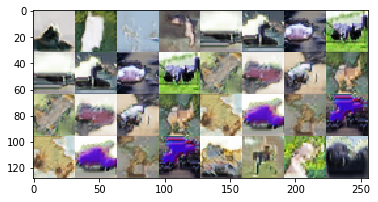

epoch 15, step 1201: d_loss 0.141864, g_loss 4.436687


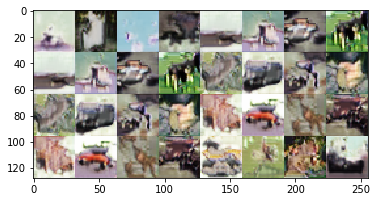

epoch 15, step 1501: d_loss 0.011156, g_loss 7.764536


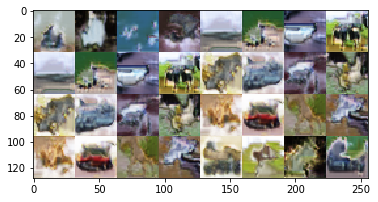

epoch 15, step 1801: d_loss 0.185992, g_loss 4.397123


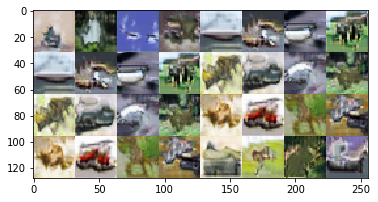

epoch 16, step 1: d_loss 0.003272, g_loss 6.365237


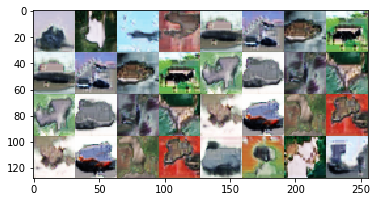

epoch 16, step 301: d_loss 0.025389, g_loss 3.044855


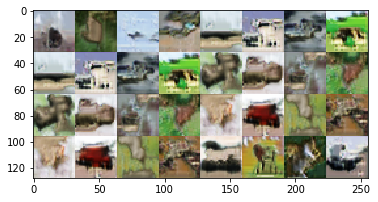

epoch 16, step 601: d_loss 0.007055, g_loss 6.284459


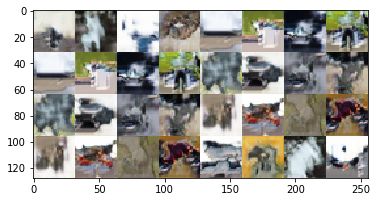

epoch 16, step 901: d_loss 0.500095, g_loss 7.121297


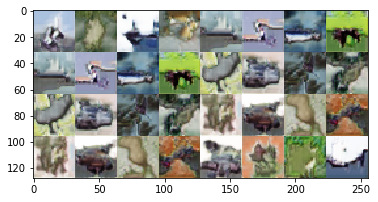

epoch 16, step 1201: d_loss 0.027390, g_loss 2.432089


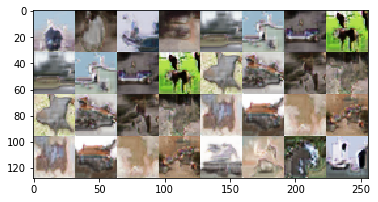

epoch 16, step 1501: d_loss 0.010376, g_loss 2.810613


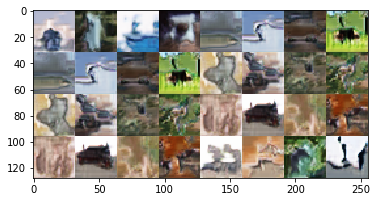

epoch 16, step 1801: d_loss 0.170320, g_loss 2.044491


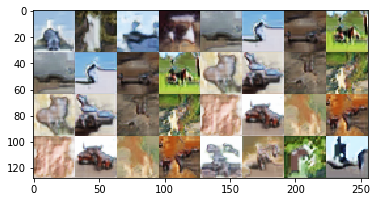

epoch 17, step 1: d_loss 0.013189, g_loss 2.016635


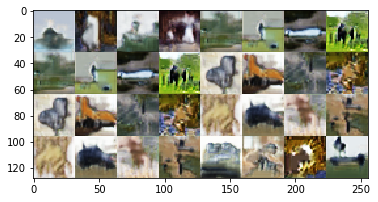

epoch 17, step 301: d_loss 0.007347, g_loss 5.613342


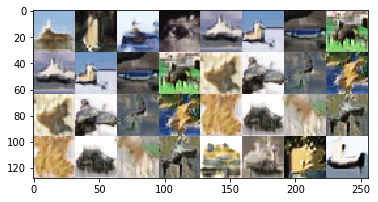

epoch 17, step 601: d_loss 0.293100, g_loss 5.134924


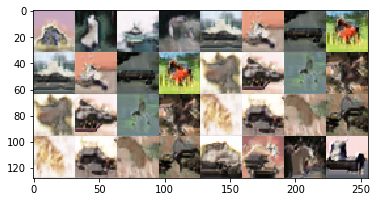

epoch 17, step 901: d_loss 0.015651, g_loss 4.759831


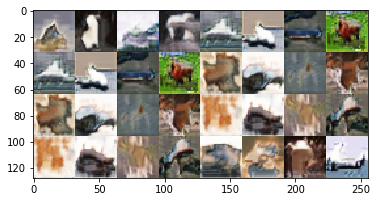

epoch 17, step 1201: d_loss 0.051727, g_loss 5.485575


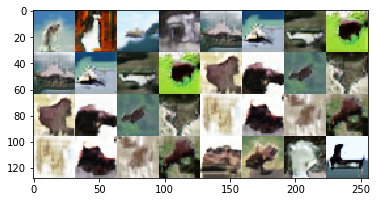

epoch 17, step 1501: d_loss 0.000090, g_loss 1.523472


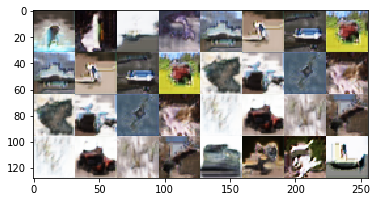

epoch 17, step 1801: d_loss 0.025506, g_loss 5.452692


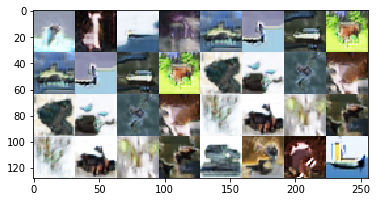

epoch 18, step 1: d_loss 0.038904, g_loss 6.335169


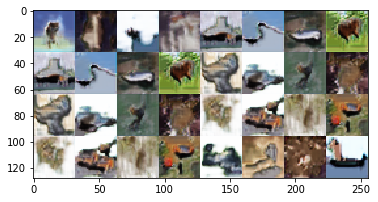

epoch 18, step 301: d_loss 0.133461, g_loss 4.491898


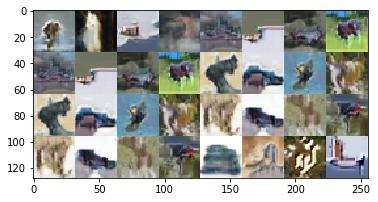

epoch 18, step 601: d_loss 0.037493, g_loss 5.037222


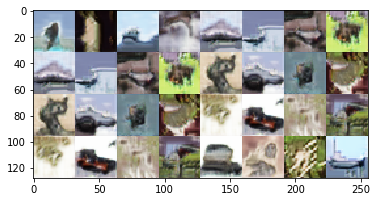

epoch 18, step 901: d_loss 0.032263, g_loss 2.903652


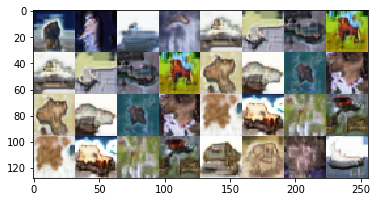

epoch 18, step 1201: d_loss 0.009205, g_loss 6.189612


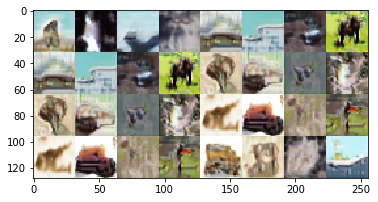

epoch 18, step 1501: d_loss 0.020497, g_loss 5.435145


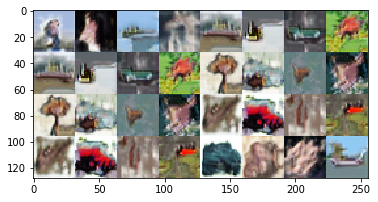

epoch 18, step 1801: d_loss 0.011107, g_loss 3.971358


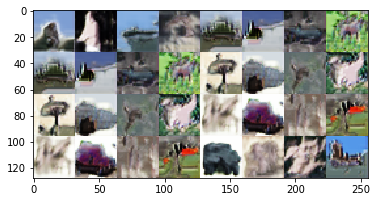

epoch 19, step 1: d_loss 0.004261, g_loss 4.124954


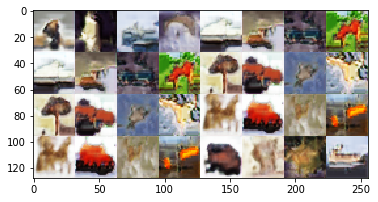

epoch 19, step 301: d_loss 0.001409, g_loss 6.735229


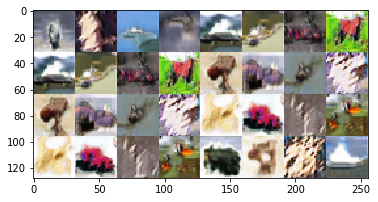

epoch 19, step 601: d_loss 0.005341, g_loss 5.430638


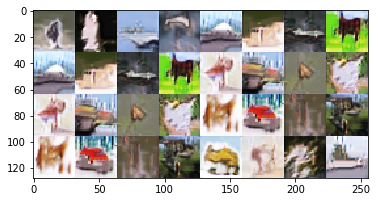

epoch 19, step 901: d_loss 0.001367, g_loss 2.157393


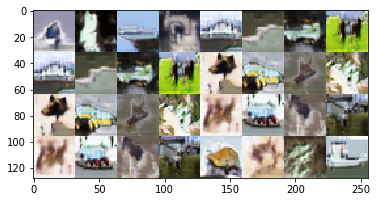

epoch 19, step 1201: d_loss 0.016722, g_loss 7.654540


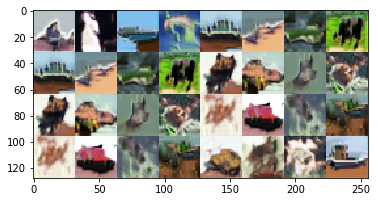

epoch 19, step 1501: d_loss 0.031443, g_loss 4.169031


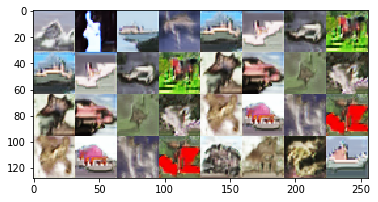

epoch 19, step 1801: d_loss 0.012692, g_loss 4.291568


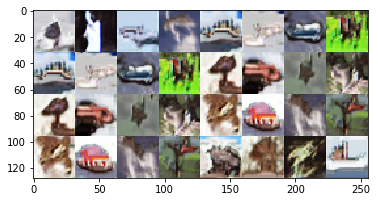

epoch 20, step 1: d_loss 0.002631, g_loss 6.583776


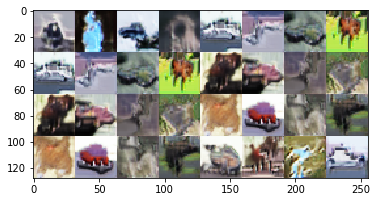

epoch 20, step 301: d_loss 0.175037, g_loss 3.672408


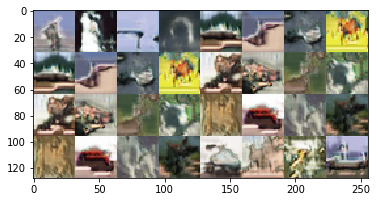

epoch 20, step 601: d_loss 0.009601, g_loss 5.818886


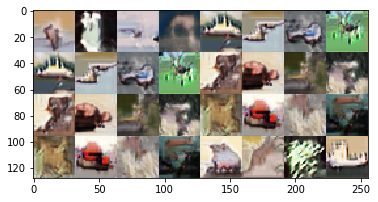

epoch 20, step 901: d_loss 0.025925, g_loss 3.669549


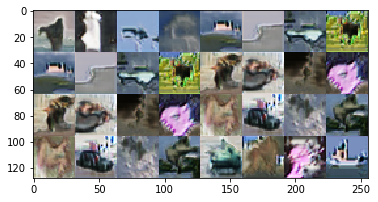

epoch 20, step 1201: d_loss 0.005364, g_loss 6.514087


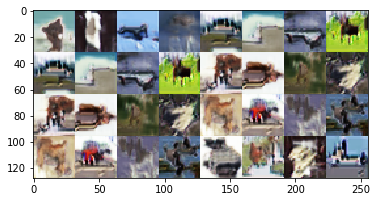

epoch 20, step 1501: d_loss 0.158937, g_loss 3.536576


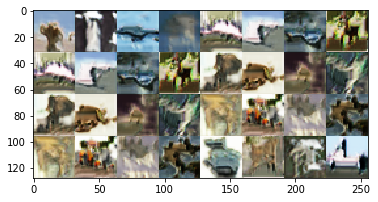

epoch 20, step 1801: d_loss 0.064334, g_loss 4.101668
Done!


In [10]:
step_num = dataset_size // batch_size
fixed_noise = np.random.normal(0, 1, [batch_size, latent_size])
one_labels = np.ones((batch_size, 1))
zero_labels = np.zeros((batch_size, 1))
for epoch in range(epoch_num):

    for step in range(step_num):
        latent_noise = np.random.normal(0, 1, [batch_size, latent_size])
        random_index = np.random.randint(0, dataset_size, batch_size)
        real_images = dataset[random_index]
        fake_images = G_net.predict(latent_noise)

        d_loss_real = D_net.train_on_batch(real_images, one_labels)
        d_loss_fake = D_net.train_on_batch(fake_images, zero_labels)
        d_loss = (d_loss_real + d_loss_fake) / 2
        
        latent_noise = np.random.normal(0, 1, [batch_size, latent_size])
        g_loss = Combined_net.train_on_batch(latent_noise, one_labels)
        #print("epoch %d, step %d: d_loss %f, g_loss %f" % (epoch + 1, step + 1, d_loss, g_loss))
        
        if step % 300 == 0:

            gen_img = G_net.predict(fixed_noise)
            show_img = covert_to_show(gen_img, 4, 8)
            show_img = ((show_img * 0.5 + 0.5)*255).astype(np.uint8)
            plt.imshow(show_img)
            plt.show()
            print("epoch %d, step %d: d_loss %f, g_loss %f" % (epoch + 1, step + 1, d_loss, g_loss))
    
print('Done!')


